In [2]:
%matplotlib inline


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
import plotly.express as px




In [85]:
data=pd.read_csv('train.csv')

In [87]:
data

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0
...,...,...,...,...,...,...
404285,404285,433578,379845,How many keywords are there in the Racket prog...,How many keywords are there in PERL Programmin...,0
404286,404286,18840,155606,Do you believe there is life after death?,Is it true that there is life after death?,1
404287,404287,537928,537929,What is one coin?,What's this coin?,0
404288,404288,537930,537931,What is the approx annual cost of living while...,I am having little hairfall problem but I want...,0


In [90]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404290 non-null  int64 
 1   qid1          404290 non-null  int64 
 2   qid2          404290 non-null  int64 
 3   question1     404289 non-null  object
 4   question2     404288 non-null  object
 5   is_duplicate  404290 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


In [92]:
data.isna().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [94]:
data.dropna(inplace=True)

In [96]:
data

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0
...,...,...,...,...,...,...
404285,404285,433578,379845,How many keywords are there in the Racket prog...,How many keywords are there in PERL Programmin...,0
404286,404286,18840,155606,Do you believe there is life after death?,Is it true that there is life after death?,1
404287,404287,537928,537929,What is one coin?,What's this coin?,0
404288,404288,537930,537931,What is the approx annual cost of living while...,I am having little hairfall problem but I want...,0


In [98]:
data['is_duplicate'].value_counts()

is_duplicate
0    255024
1    149263
Name: count, dtype: int64

In [100]:
data['is_duplicate'].value_counts()/ data['is_duplicate'].count() *100

is_duplicate
0    63.079941
1    36.920059
Name: count, dtype: float64

  We have unbalanced data where non duplicate questions are 63%

In [104]:
data.duplicated().sum()

np.int64(0)

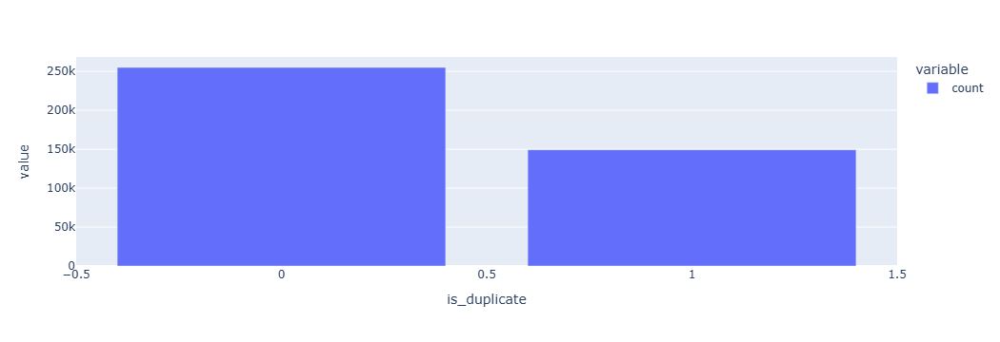

In [105]:
px.bar(data['is_duplicate'].value_counts())

df['qid1'].tolist() and df['qid2'].tolist()

These take the two columns (qid1 and qid2), each containing question IDs, and convert them into Python lists.

Example:

qid1 → [1, 2, 3, 4]  
qid2 → [5, 6, 2, 7]


+ (list concatenation)

Joins the two lists into one:

[1, 2, 3, 4, 5, 6, 2, 7]


pd.Series(...)

Converts the combined list into a Pandas Series, so you can work with it more easily.

np.unique(qid)

Gets all unique question IDs across both qid1 and qid2.

From the example:

Unique IDs → [1, 2, 3, 4, 5, 6, 7]


.shape[0]

Counts how many unique IDs exist.

Number of unique questions = 7


✅ So, your code finds out:
👉 How many distinct questions exist in the entire dataset, regardless of whether they appear as qid1 or qid2.

In [112]:
# repeated Question
qid=pd.Series(data['qid1'].tolist() + data['qid2'].tolist())

In [114]:
qid

0              1
1              3
2              5
3              7
4              9
           ...  
808569    379845
808570    155606
808571    537929
808572    537931
808573    537933
Length: 808574, dtype: int64

In [116]:
print("number of unique question",np.unique(qid).shape[0])

number of unique question 537929


In [118]:
x=qid.value_counts()>1
print("number of non unique question", x[x].shape[0])

number of non unique question 111778


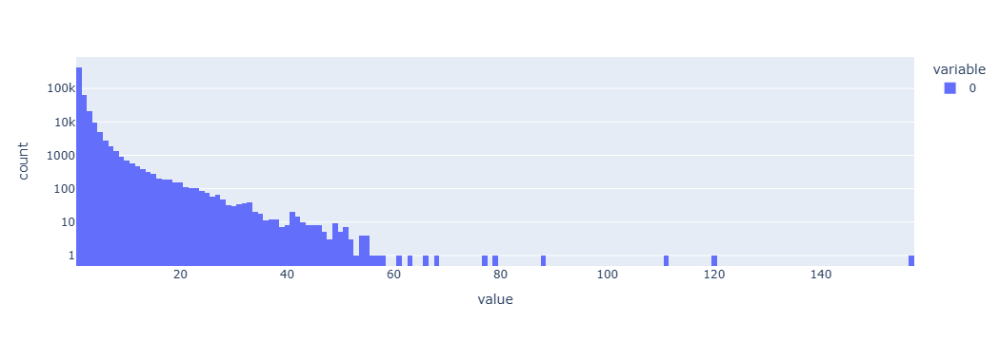

In [121]:

px.histogram(qid.value_counts().values,log_y=True)


In [125]:
# most question are repeated single or 2 time and some are outliers